In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [16]:
data_folder = "data/raw/Hillerod_2021-2024.csv"
df0 = pd.read_csv(data_folder)
df0.set_index("DATETIME", inplace=True)
df0.index = pd.to_datetime(df0.index)
df0.sort_index(ascending=True, inplace=True)

In [57]:
pollutants = ["TOC", "TN", "TP", "SS"]
flows = ["Flow", "Bypass"]

In [58]:
df = df0.resample("h").mean()

df["hour_of_year"] = (df.index.day_of_year - 1) * 24 + df.index.hour
df["datetime"] = df.index

melted_index = "datetime"

columns_df = df.columns
melted_df = pd.melt(df, id_vars=[melted_index], value_vars=columns_df)
melted_df["family"] = "Flow"
melted_df.loc[melted_df["variable"].isin(pollutants).to_list(), "family"] = "Pollutant"

In [70]:
fig = px.line(melted_df[melted_df.variable.isin(pollutants + flows)], x=melted_index, y="value", color="variable", facet_row="family", width=1600, height=600)
fig.update_xaxes(title_text=melted_index)
fig.update_yaxes(title_text='Value', matches="x")
fig.show()

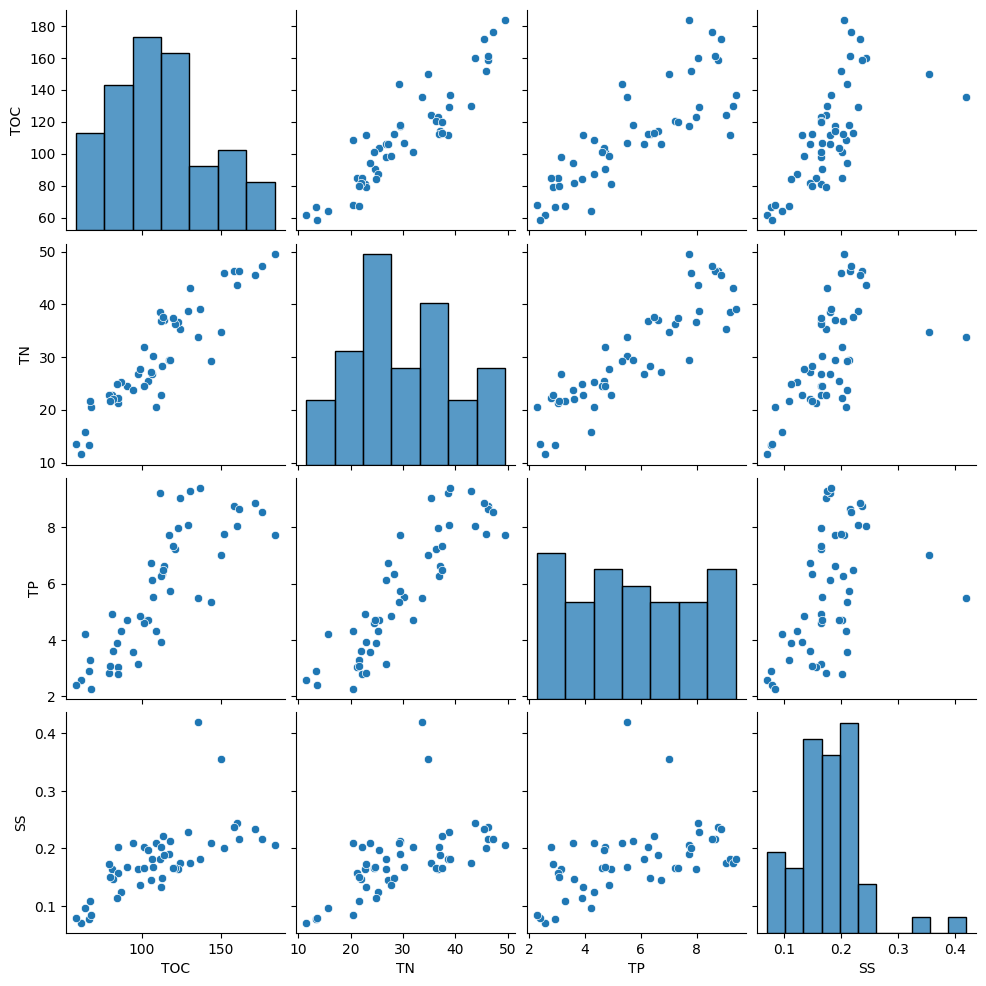

In [76]:
np.random.seed(84)

nrows = df.shape[0]
sample_size = 50
ix = np.random.randint(0, nrows-sample_size)
sample_df = df.iloc[ix:ix+sample_size, :]
sample_df.shape

sns.pairplot(sample_df[pollutants])

In [ ]:
# Cleaning:
# TODO: - Fill in gaps in data
# TODO: - Replace negative values
# Feature engineering:
# TODO: - Take the logarithm of the concentrations (to reduce the effects of extreme values)
# TODO: - Include lagged variables 